# Analysis of CMIP6 easterlies

Assessing the skill of CMIP6 models in different regions of the continental shelf.

In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import dask.distributed as dsk
import glob
import matplotlib.gridspec as gs
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import netCDF4 as nc
import numpy as np
import scipy.stats as st
import skill_metrics as sm
import xarray as xr
from xarrayMannKendall import *
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from palettable.scientific.sequential import Oleron_11
from sklearn.metrics import mean_squared_error

import warnings # ignore these warnings
warnings.filterwarnings("ignore", category = FutureWarning)
warnings.filterwarnings("ignore", category = UserWarning)
warnings.filterwarnings("ignore", category = RuntimeWarning)

figdir = '/home/561/jn8053/g_e14/figures-tmp/'

clnt = dsk.Client()
clnt

Client Scheduler: tcp://127.0.0.1:38115 Dashboard: /proxy/8787/status,Cluster Workers: 4 Cores: 16 Memory: 268.44 GB


In [18]:
# Font size
plt.rcParams['font.size'] = 16
# Axes
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
# Saving parameters
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['savefig.bbox'] = 'tight'

def change_lon_space(ds, grid):
    if grid == 'u':
        ds = ds.rename(({'xu_ocean':'lon', 'yu_ocean':'lat'}))
        ds['_lon_adj'] = xr.where(ds['lon'] < 0, ds['lon'] + 360, ds['lon'])
        ds = ds.swap_dims({'lon': '_lon_adj'})
        ds = ds.sel(**{'_lon_adj': sorted(ds._lon_adj)}).drop('lon')
        ds = ds.rename({'_lon_adj': 'lon'})
    elif grid == 't':
        ds = ds.rename(({'xt_ocean':'lon', 'yt_ocean':'lat'}))
        ds['_lon_adj'] = xr.where(ds['lon'] < 0, ds['lon'] + 360, ds['lon'])
        ds = ds.swap_dims({'lon': '_lon_adj'})
        ds = ds.sel(**{'_lon_adj': sorted(ds._lon_adj)}).drop('lon')
        ds = ds.rename({'_lon_adj': 'lon'})
    return ds

def circumpolar_map():
    
    fig = plt.figure(figsize = (12, 8))
    axs = fig.add_subplot(projection = ccrs.Mercator(central_longitude = 180))
    axs.set_extent([0, 2600, -80, -50], crs = ccrs.PlateCarree())
    axs.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                    edgecolor = 'black', facecolor = 'none'))
    axs.set_xticks(np.arange(0, 400, 50), crs = ccrs.PlateCarree())
    axs.set_yticks([-75, -70, -65, -60, -55], crs = ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label = False)
    lat_formatter = LatitudeFormatter()
    axs.xaxis.set_major_formatter(lon_formatter)
    axs.yaxis.set_major_formatter(lat_formatter)
    
    return fig, axs

def extract_so(ds):
    ds_so = ds.sel(lat = slice(None, -50))
    return ds_so

def time_series_plot(var, region):
    if var == 'uas':
        dset = u_regions
    elif var == 'vas':
        dset = v_regions
    plt.figure(figsize=(20, 5))
    for name in model_names:
        plt.plot(dset[region, name].values - dset[region, 'JRA'].values, linewidth = .5, label = name)
    plt.plot(dset[region, 'CMIP6'].values - dset[region, 'JRA'].values, linewidth = 2.5, color = 'k', label = 'CMIP6')
    plt.xticks(np.arange(0, 720, 12*5), dset[region, 'JRA']['time.year'].values[::12*5])
    plt.xlim(0, 684)
    plt.ylabel(var+' [m/s]')
    plt.title(region, fontsize = 16)
    plt.savefig(figdir+'easterlies-collaborative/'+var+'-onshelf-'+region+'.png', facecolor = 'white')
    
def seasonal_cycle_plot(var, region):
    if var == 'uas':
        dset = u_regions
    elif var == 'vas':
        dset = v_regions
    plt.figure(figsize=(10, 5))
    for name in model_names:
        plt.plot(dset[region, name].groupby('time.month').mean('time'), linewidth = .5, label = name)
    plt.plot(dset[region, 'CMIP6'].groupby('time.month').mean('time'), linewidth = 2.5, color = 'k', linestyle = '--', label = 'CMIP6')
    plt.plot(dset[region, 'JRA'].groupby('time.month').mean('time'), linewidth = 2.5, color = 'k', label = 'JRA55')
    plt.xticks(np.arange(0, 12, 2), ['Jan', 'Mar', 'May', 'Jul', 'Sep', 'Nov'])
    plt.xlim(0, 11)
    plt.ylabel(var+' [m/s]')
    plt.title(region, fontsize = 16)
    plt.savefig(figdir+'easterlies-collaborative/'+var+'-onshelf-'+region+'-clim.png', facecolor = 'white')

In [3]:
shelf_regions = xr.open_dataset('~/g_e14/misc/Antarctic_shelf_basins.nc')
shelf_regions = change_lon_space(shelf_regions, 't')
basins = shelf_regions['basins'].where(shelf_regions['basins'] != 100, np.nan)

## Historical (1958 - 2015)

### Load `uas` and `vas`

In [4]:
# JRA55do-v14
uas_jra = xr.open_dataset('/scratch/e14/jn8053/jra55/uas-v14-monthly-1958_2019.nc').sel(lat = slice(None, -50)).sel(time = slice('1958-01-01', '2015-01-01'))
vas_jra = xr.open_dataset('/scratch/e14/jn8053/jra55/vas-v14-monthly-1958_2019.nc').sel(lat = slice(None, -50)).sel(time = slice('1958-01-01', '2015-01-01'))

# CMIP6 multimodel mean
uas_cmip_mmm = xr.open_dataset('/scratch/e14/jn8053/cmip6/historical/uas_historical_ensmean.nc')
vas_cmip_mmm = xr.open_dataset('/scratch/e14/jn8053/cmip6/historical/vas_historical_ensmean.nc')

# CMIP6 individual models
path_uas = glob.glob('/scratch/e14/jn8053/cmip6/historical/uas/*')
path_vas = glob.glob('/scratch/e14/jn8053/cmip6/historical/vas/*')
uas_cmip = {}
vas_cmip = {}
for i in range(len(path_uas)):
    model_name = path_uas[i].split('/')[-1].split('_')[-1].split('.')[0]
    uas_cmip[model_name] = xr.open_dataset(path_uas[i])
    
    model_name = path_vas[i].split('/')[-1].split('_')[-1].split('.')[0]
    vas_cmip[model_name] = xr.open_dataset(path_vas[i])
model_names = list(uas_cmip.keys())

In [5]:
basins = basins.interp(lon = uas_jra['lon'], lat = uas_jra['lat'])

In [17]:
u_regions = {}
v_regions = {}
n = 2
for r in shelf_regions['region'].values[:-1]:
    u_regions[r, 'JRA'] = uas_jra['uas'].where(basins == n, np.nan).mean(['lon', 'lat'])
    v_regions[r, 'JRA'] = vas_jra['vas'].where(basins == n, np.nan).mean(['lon', 'lat'])
    u_regions[r, 'CMIP6'] = uas_cmip_mmm['uas'].where(basins == n, np.nan).mean(['lon', 'lat'])
    v_regions[r, 'CMIP6'] = vas_cmip_mmm['vas'].where(basins == n, np.nan).mean(['lon', 'lat'])
    for name in model_names:
        u_regions[r, name] = uas_cmip[name].interp(lon = uas_jra['lon'], lat = uas_jra['lat'])['uas'].where(basins == n, np.nan).mean(['lon', 'lat'])
        v_regions[r, name] = vas_cmip[name].interp(lon = uas_jra['lon'], lat = uas_jra['lat'])['vas'].where(basins == n, np.nan).mean(['lon', 'lat'])
    n += 1

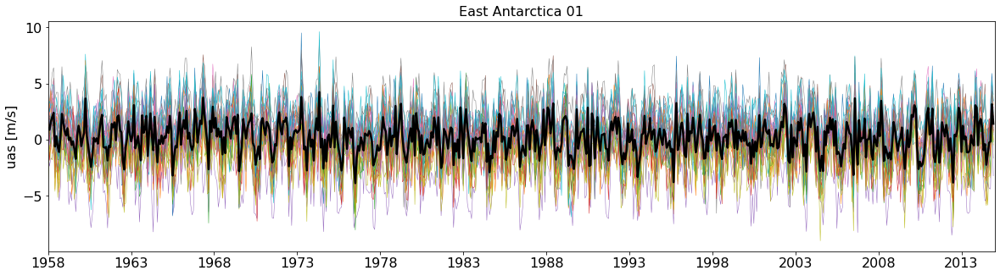

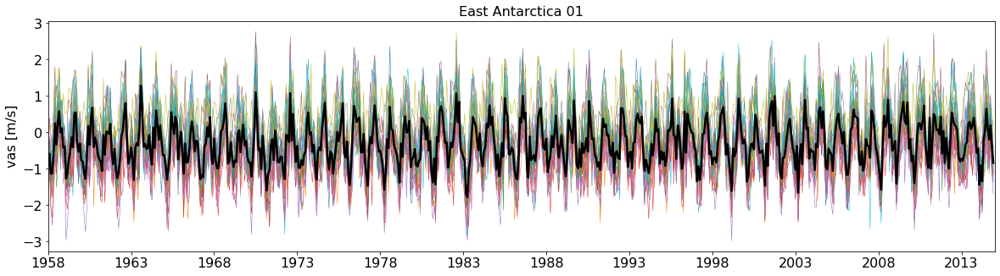

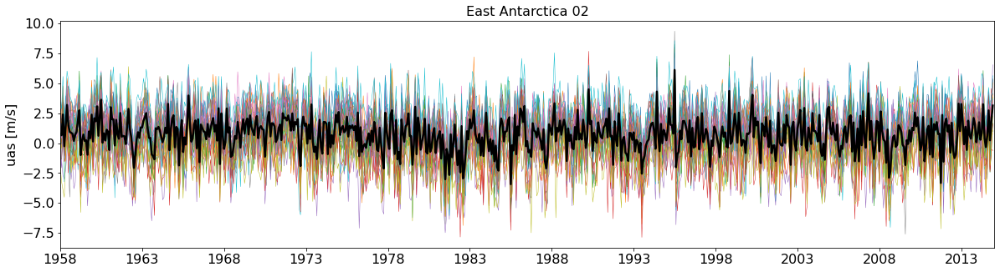

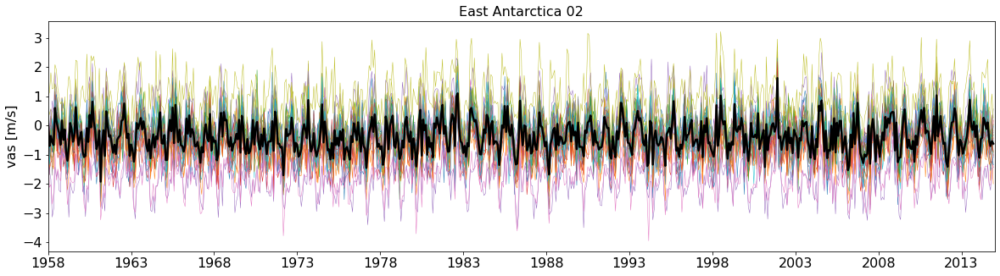

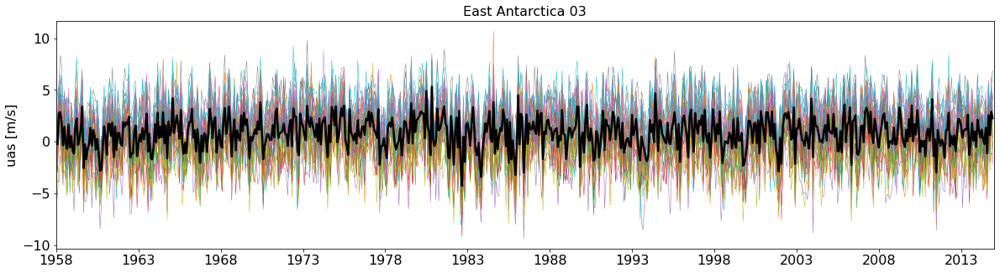

...

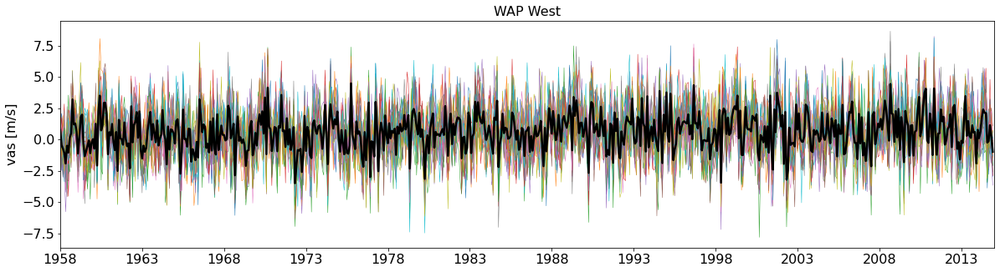

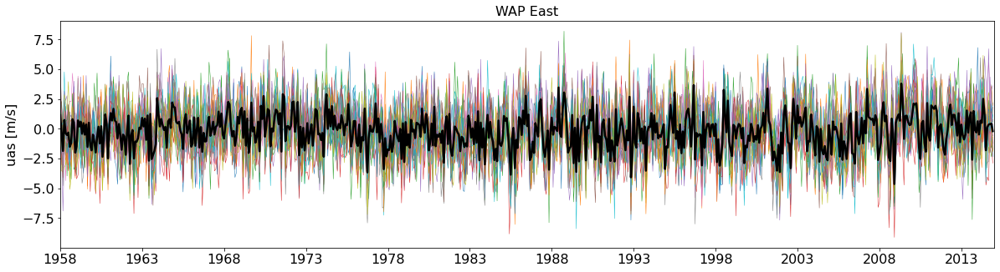

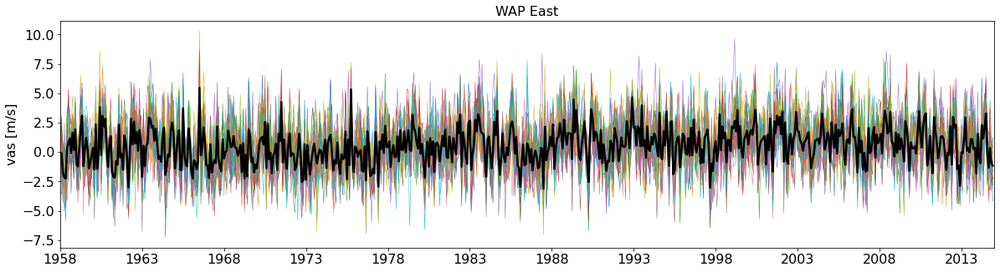

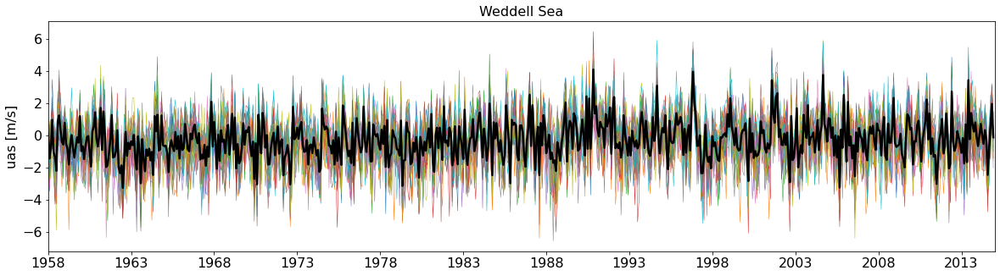

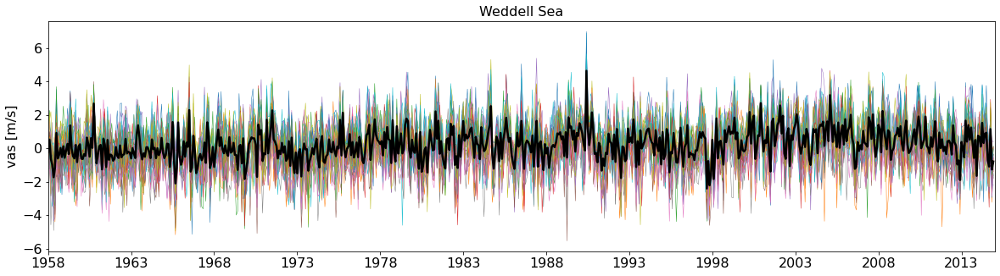

In [72]:
for r in shelf_regions['region'].values[:-1]:
    time_series_plot('uas', r)
    time_series_plot('vas', r)

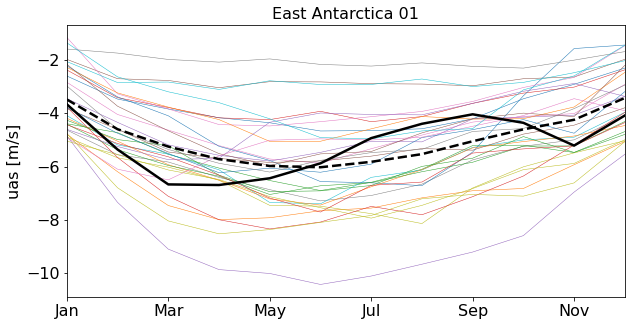

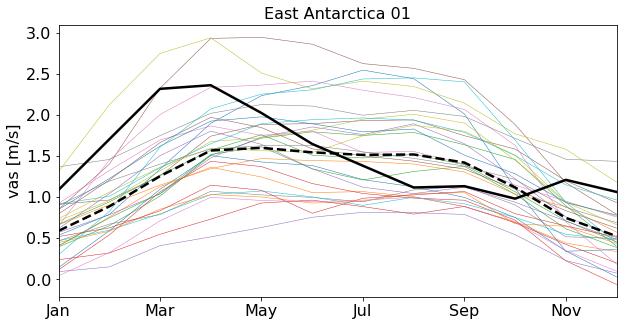

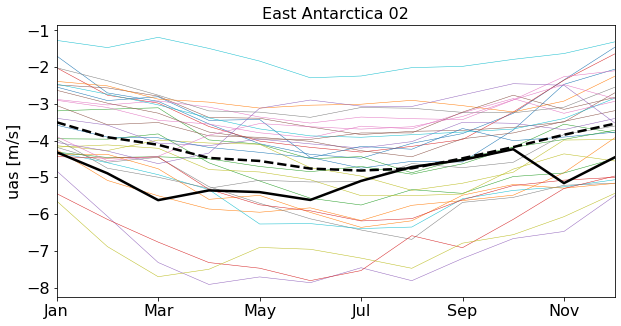

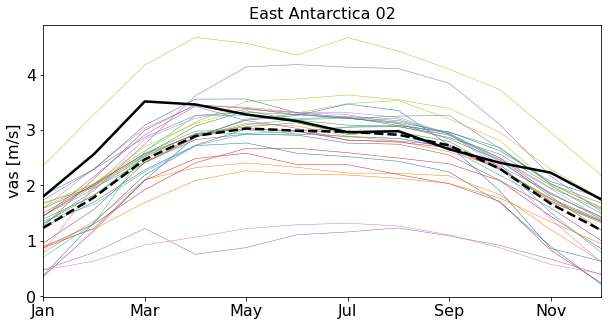

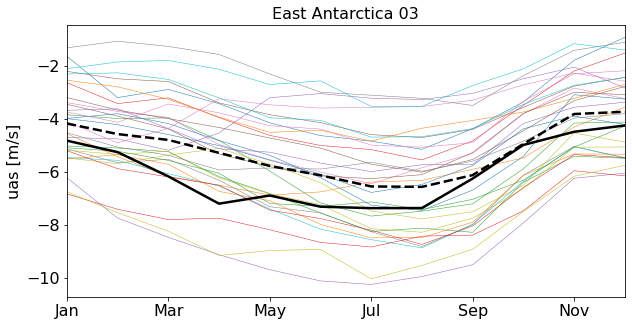

...

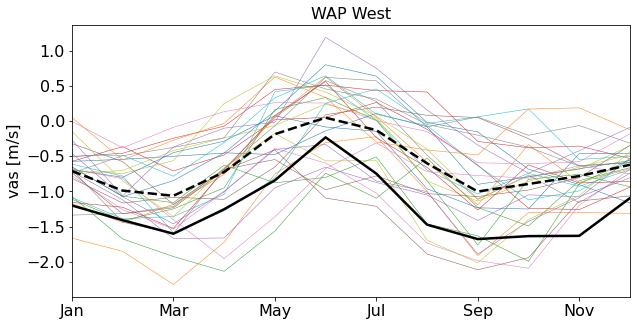

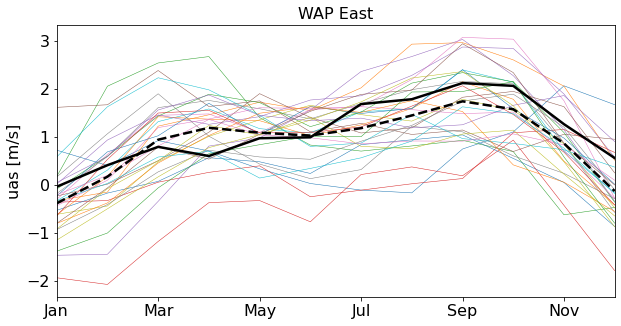

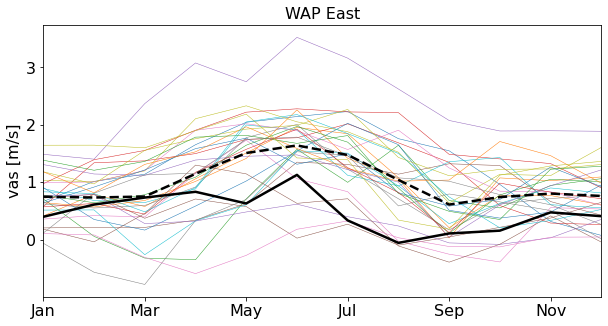

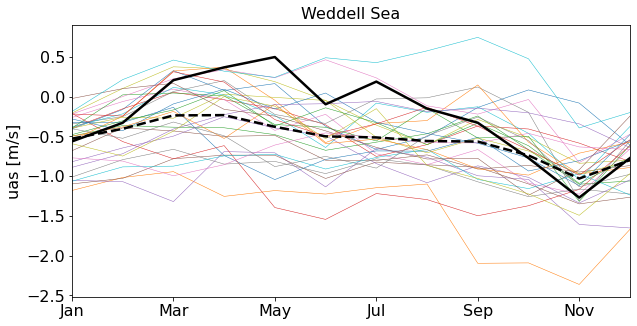

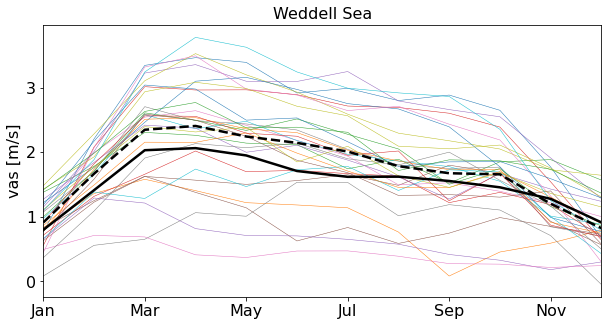

In [19]:
for r in shelf_regions['region'].values[:-1]:
    seasonal_cycle_plot('uas', r)
    seasonal_cycle_plot('vas', r)

# Taylor diagrams

To assess models skill.

Matt pointed out that we don't expect these models to correlate with obs. month-to-monnth, most of them don't even get el Nino events when they happen. It would be better to see how the trends compare for example.

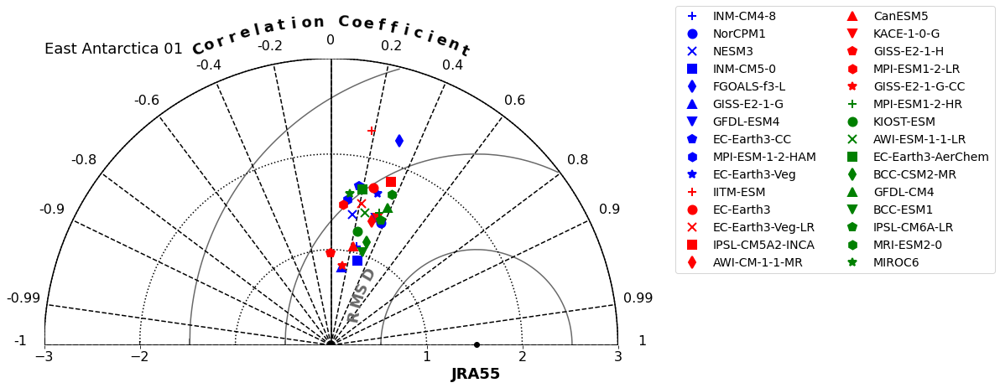

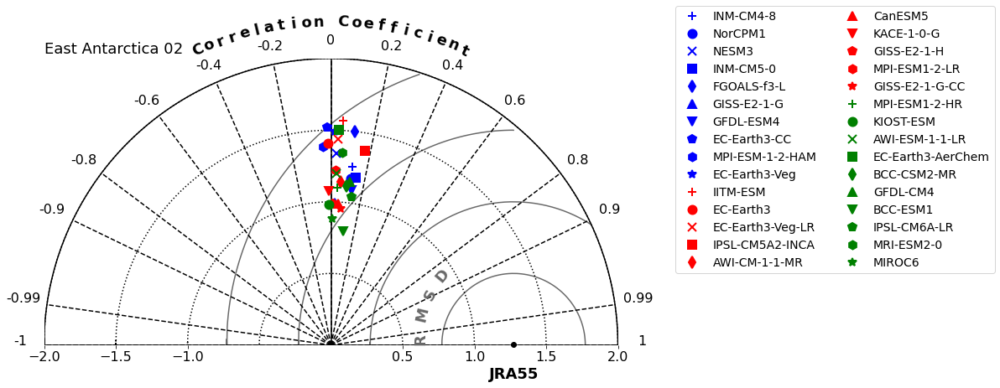

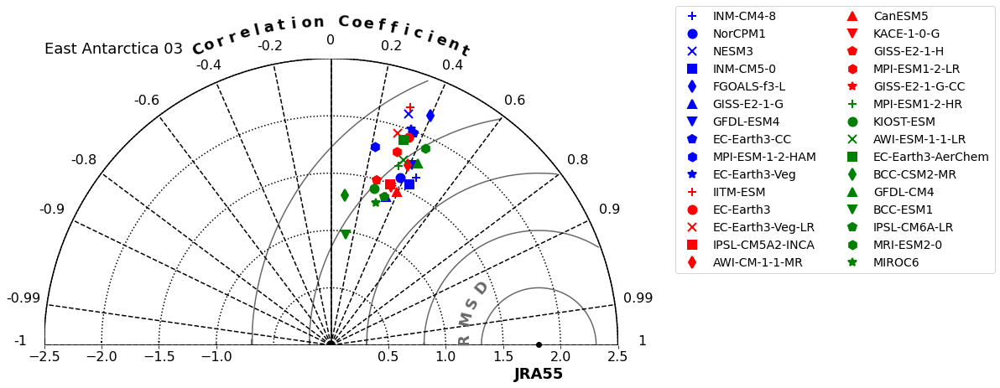

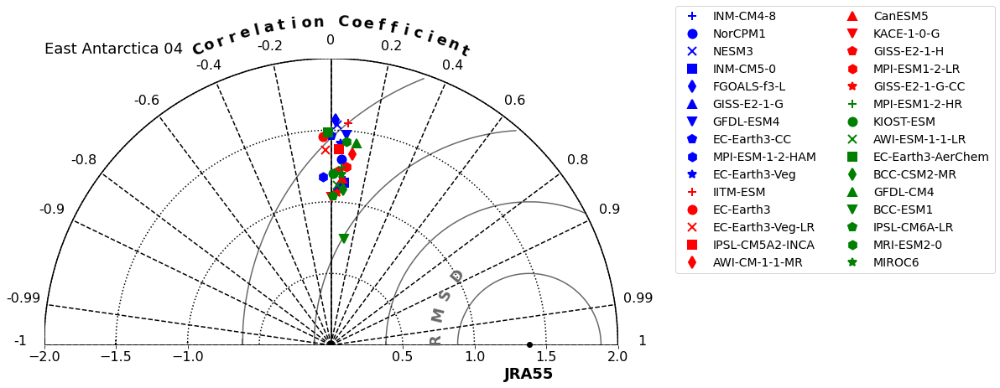

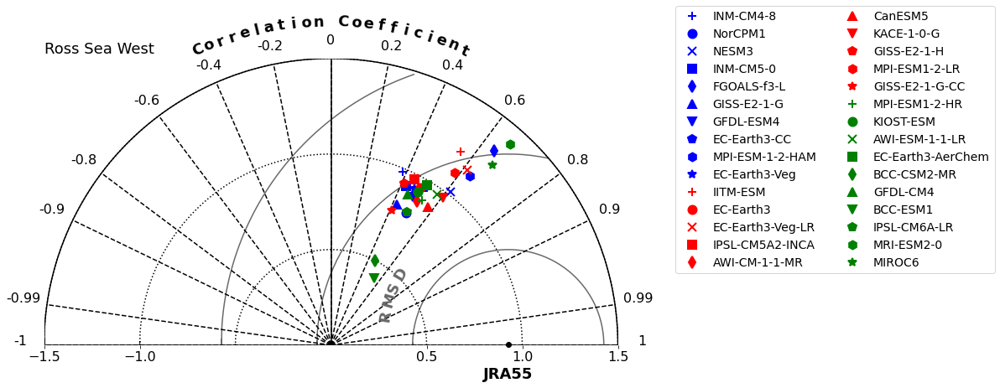

...

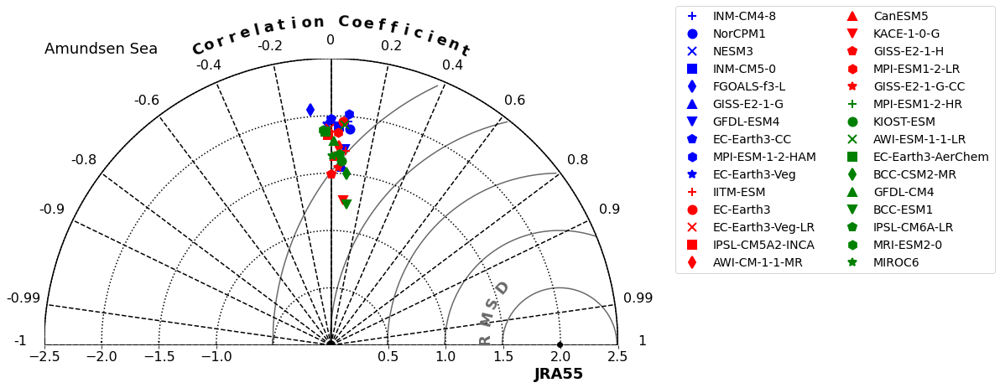

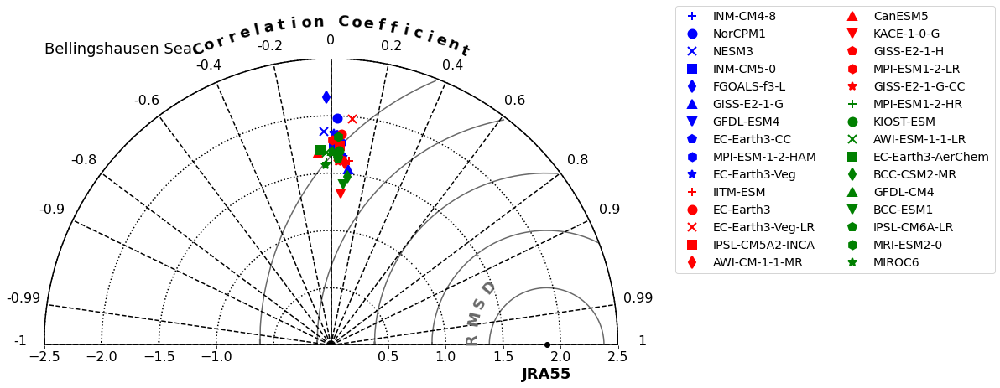

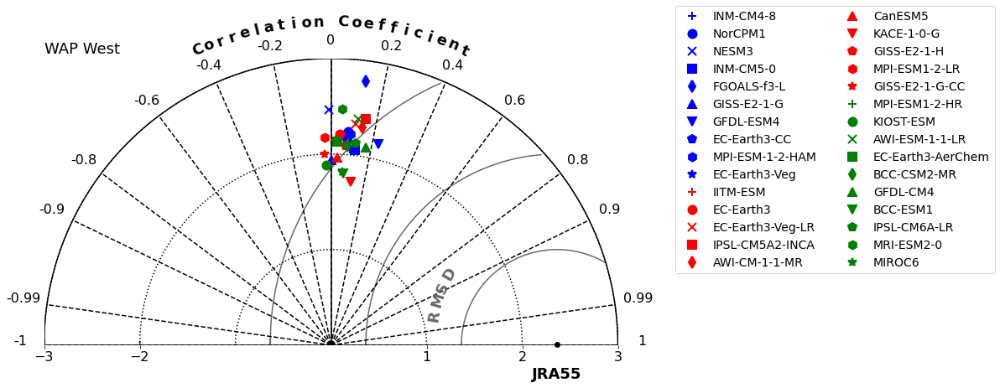

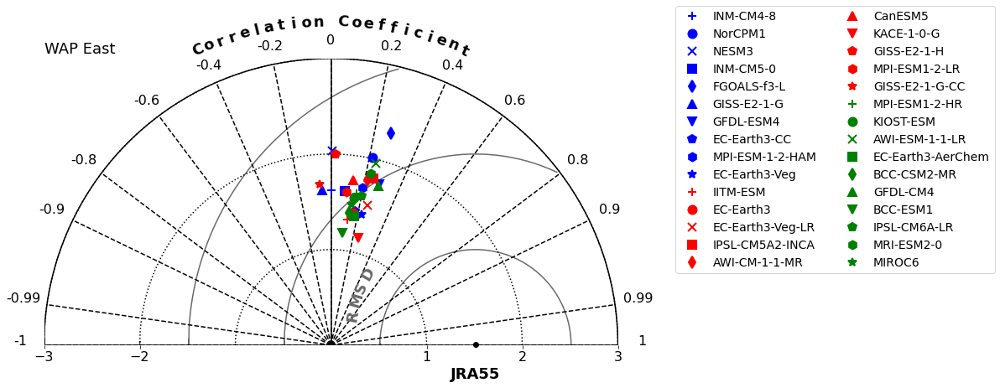

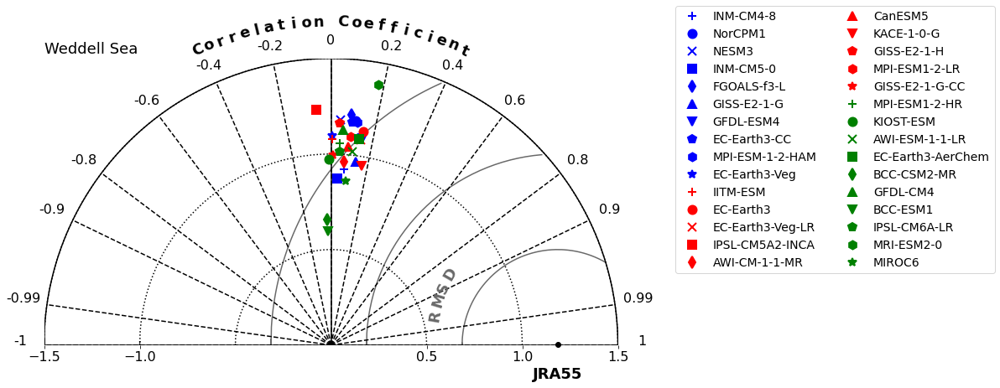

In [23]:
for r in shelf_regions['region'].values[:-1]:
    # Calculate sdev, crmse and ccoef for each cmip6 model and region
    sdev = np.empty(len(model_names)+1)
    crms = np.empty(len(model_names)+1)
    ccoe = np.empty(len(model_names)+1)
    sdev[0] = u_regions[r, 'JRA'].std('time').values
    crms[0] = 0
    ccoe[0] = 1
    for i in range(0, len(model_names)):
        sdev[i+1] = u_regions[r, model_names[i]].std('time').values
        crms[i+1] = np.sqrt(mean_squared_error(u_regions[r, 'JRA'], u_regions[r, model_names[i]]))
        ccoe[i+1] = st.linregress(u_regions[r, 'JRA'], u_regions[r, model_names[i]]).rvalue
        
    plt.figure(figsize=(20, 15))
    sm.taylor_diagram(sdev, crms, ccoe, numberPanels = 2, 
                      markerObs = 'o', colOBS = 'k', titleOBS = 'JRA55',
                      markerLegend = 'on', markerLabel = ['JRA55'] + model_names,
                      colRMS = 'dimgrey', showlabelsRMS = 'off', styleRMS = '-', 
                      colCOR = 'k', styleCOR = '--', tickCOR = [-1, -.99, -.9, -.8, -.6, -.4, -.2, 0, .2, .4, .6, .8, .9, .99, 1])
    plt.title(r, fontsize = 18, loc = 'left')
    plt.savefig(figdir+'/easterlies-collaborative/taylordiag-uas-'+r+'.png')

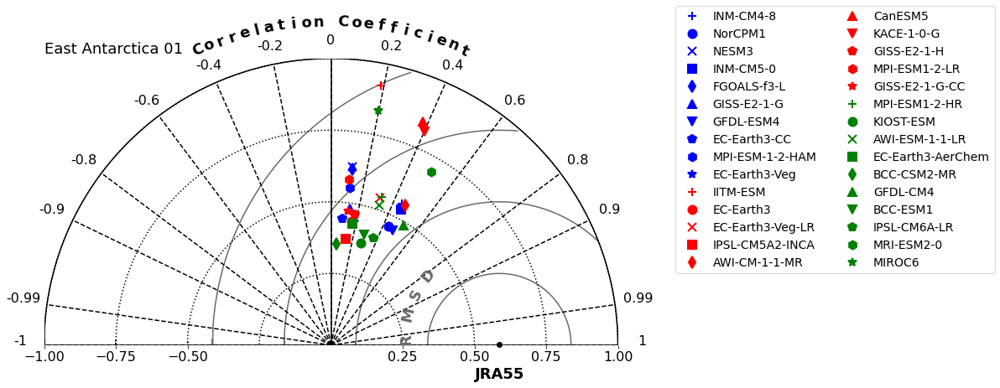

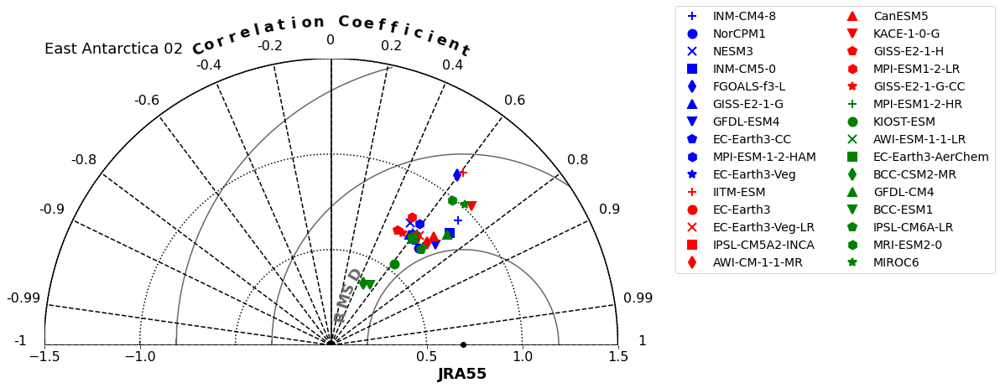

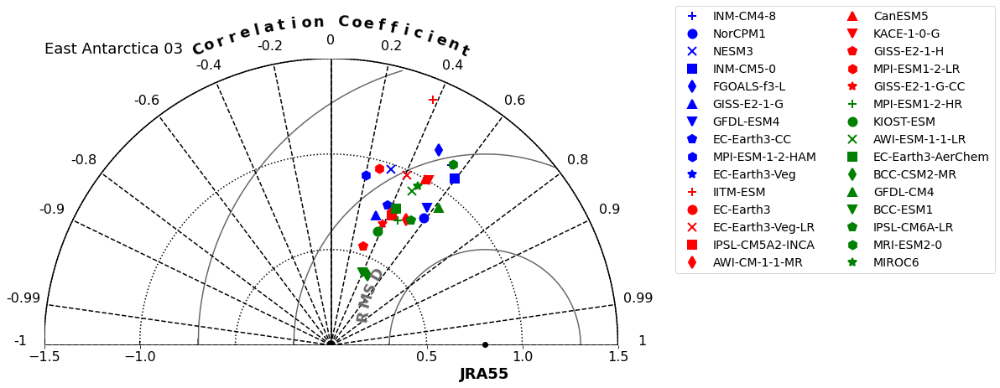

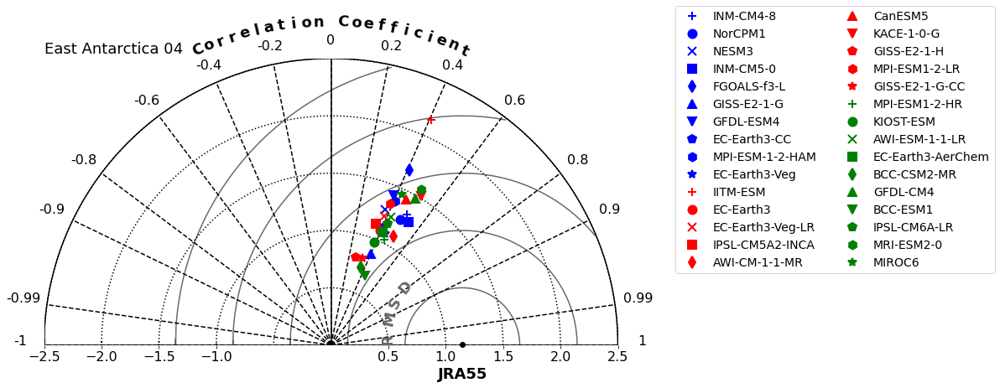

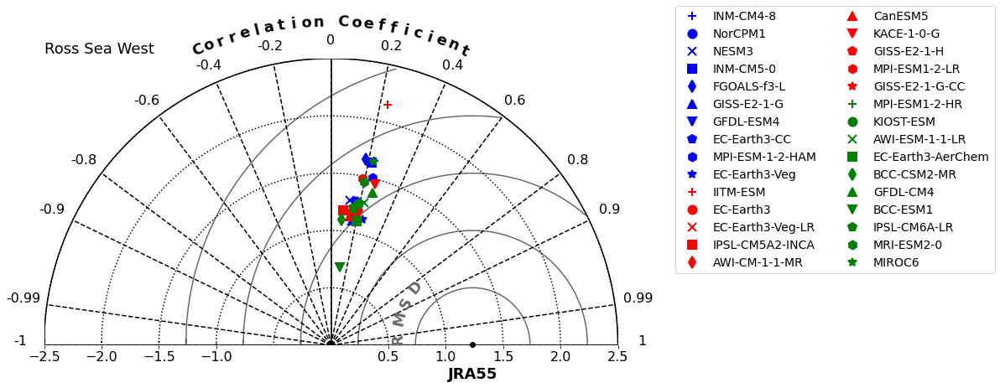

...

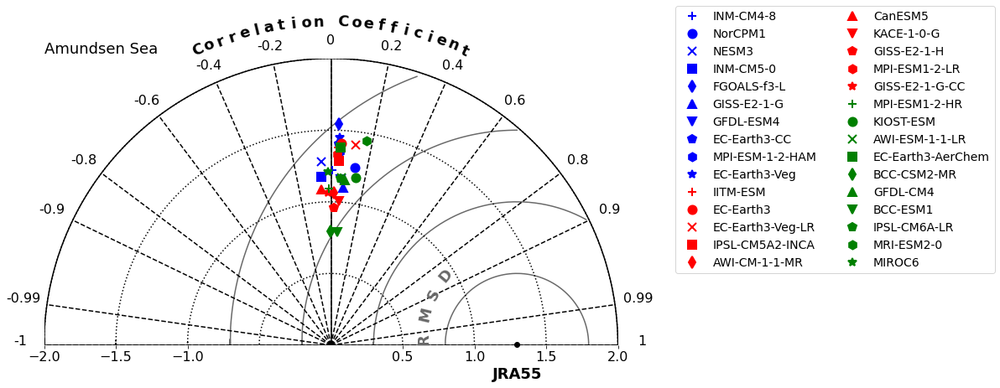

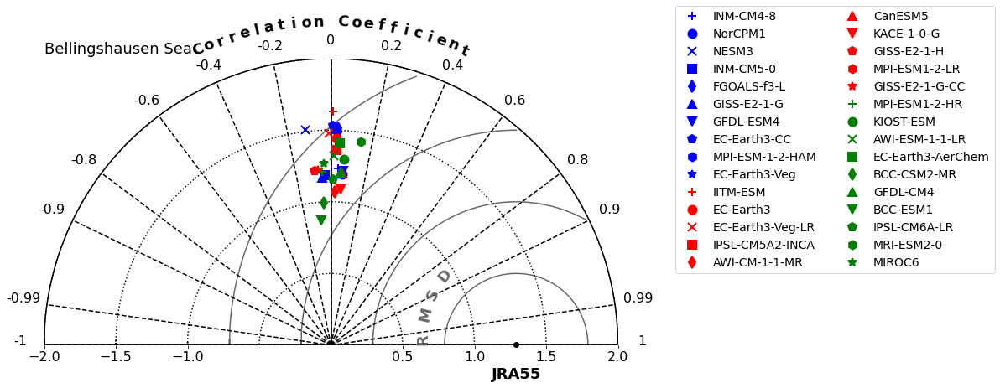

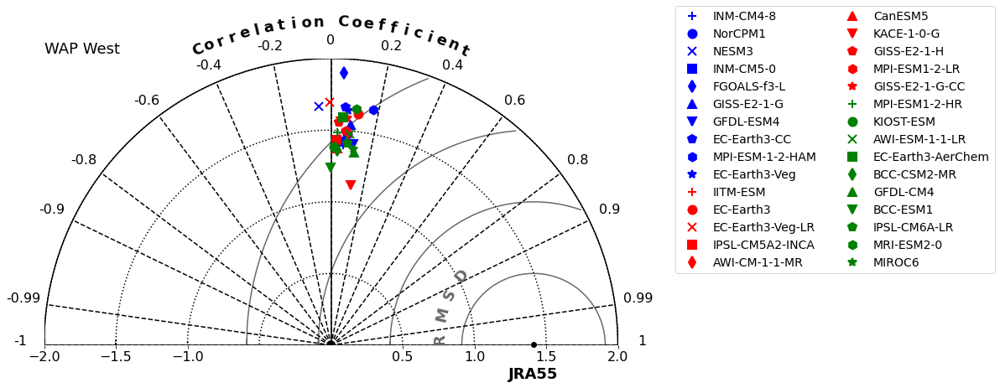

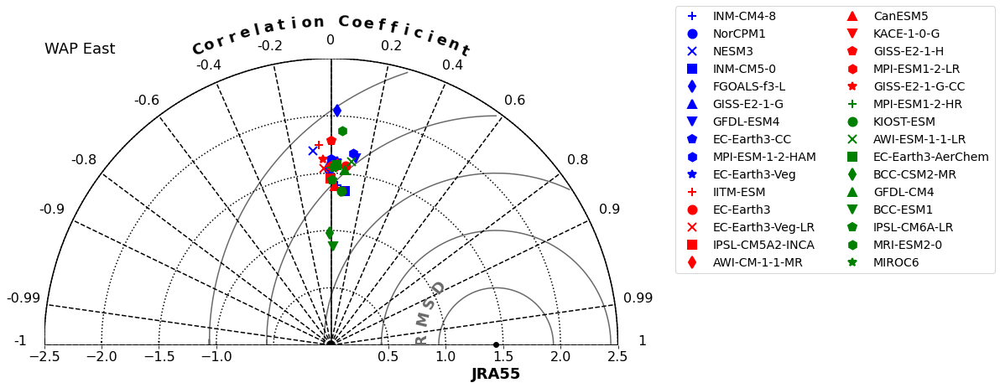

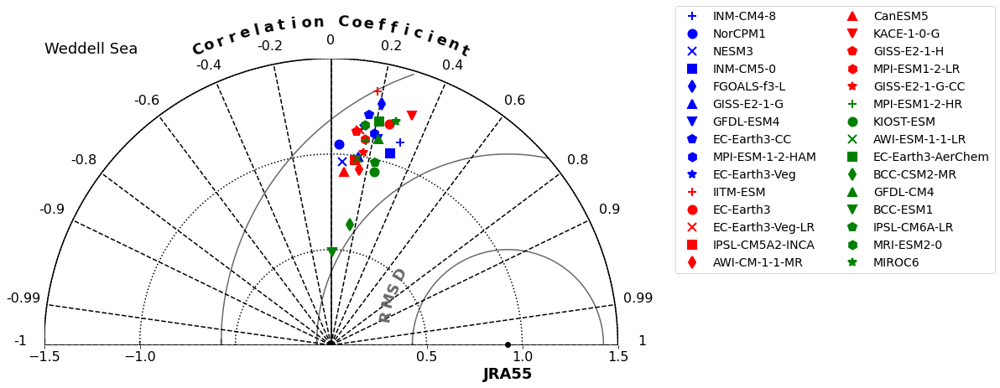

In [24]:
for r in shelf_regions['region'].values[:-1]:
    # Calculate sdev, crmse and ccoef for each cmip6 model and region
    sdev = np.empty(len(model_names)+1)
    crms = np.empty(len(model_names)+1)
    ccoe = np.empty(len(model_names)+1)
    sdev[0] = v_regions[r, 'JRA'].std('time').values
    crms[0] = 0
    ccoe[0] = 1
    for i in range(0, len(model_names)):
        sdev[i+1] = v_regions[r, model_names[i]].std('time').values
        crms[i+1] = np.sqrt(mean_squared_error(v_regions[r, 'JRA'], v_regions[r, model_names[i]]))
        ccoe[i+1] = st.linregress(v_regions[r, 'JRA'], v_regions[r, model_names[i]]).rvalue
        
    plt.figure(figsize=(20, 15))
    sm.taylor_diagram(sdev, crms, ccoe, numberPanels = 2, 
                      markerObs = 'o', colOBS = 'k', titleOBS = 'JRA55',
                      markerLegend = 'on', markerLabel = ['JRA55'] + model_names,
                      colRMS = 'dimgrey', showlabelsRMS = 'off', styleRMS = '-', 
                      colCOR = 'k', styleCOR = '--', tickCOR = [-1, -.99, -.9, -.8, -.6, -.4, -.2, 0, .2, .4, .6, .8, .9, .99, 1])
    plt.title(r, fontsize = 18, loc = 'left')
    plt.savefig(figdir+'/easterlies-collaborative/taylordiag-vas-'+r+'.png')

# Trends and bias

In [79]:
bias = {}
bias_baseline = {}
for r in shelf_regions['region'].values[:-1]:
    bias[r] = np.empty(len(model_names)+2)
    bias_baseline[r] = np.empty(len(model_names)+2)
    bias[r][0] = 1
    bias_baseline[r][0] = 1
    bias[r][1] = (u_regions[r, 'CMIP6'].mean('time') - u_regions[r, 'JRA'].mean('time')).values
    bias_baseline[r][1] = (u_regions[r, 'CMIP6'].sel(time = slice('1958-01-01', '1970-01-01')).mean('time') - u_regions[r, 'JRA'].sel(time = slice('1958-01-01', '1970-01-01')).mean('time')).values
    i = 2
    for name in model_names:
        bias[r][i] = (u_regions[r, name].mean('time') - u_regions[r, 'JRA'].mean('time')).values
        bias_baseline[r][i] = (u_regions[r, name].sel(time = slice('1958-01-01', '1970-01-01')).mean('time') - u_regions[r, 'JRA'].sel(time = slice('1958-01-01', '1970-01-01')).mean('time')).values
        i += 1

In [82]:
MK_trends = {}
for r in shelf_regions['region'].values[:-1]:
    dset = xr.DataArray(u_regions[r, 'JRA'])
    u_regions[r, 'CMIP6']['time'] = uas_jra['time']
    dset = xr.concat([dset, u_regions[r, 'CMIP6']], dim = 'model')
    for n in model_names:
        u_regions[r, n]['time'] = uas_jra['time']
        dset = xr.concat([dset, u_regions[r, n]], dim = 'model')
    dset['model'] = ['JRA'] + ['CMIP6'] + model_names
    MK_class = Mann_Kendall_test(dset, 'time', coords_name = {'time':'time', 'model':'x'})
    MK_trends[r] = MK_class.compute()

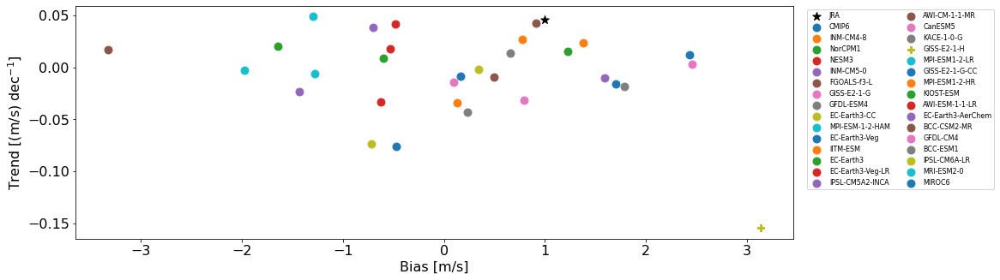

In [114]:
plt.figure(figsize = (15, 5))
for i in range(0, len(model_names)+2):
    if MK_trends['East Antarctica 01']['signif'][i].values == 0:
        mrkr = 'o'
    else:
        mrkr = 'P'
    if i == 0:
        plt.scatter(bias['East Antarctica 01'][i], MK_trends['East Antarctica 01']['trend'][i]*120, s = 100,
                    color = 'k', marker = '*', label = MK_trends['East Antarctica 01']['x'][i].values)
    else:
        plt.scatter(bias['East Antarctica 01'][i], MK_trends['East Antarctica 01']['trend'][i]*120, s = 80,
                    marker = mrkr, label = MK_trends['East Antarctica 01']['x'][i].values)
    plt.legend(ncol = 2, bbox_to_anchor = (1.15, 1), loc = 'upper center', fontsize = 8)
    plt.ylabel('Trend [(m/s) dec$^{-1}$]')
    plt.xlabel('Bias [m/s]')